In [1]:
using GraphRecipes
using Clustering
using Plots
using DelimitedFiles
using LinearAlgebra
using MatrixNetworks
using SparseArrays
using Random
Random.seed!(1234);  # determinism
# pre-compile some code
plot([1], [1]);      
spy(sparse([1], [1], 1, 1, 1));
kmeans([1. 1.; 2. 2.; 3. 3.]', 2);

In [2]:
# Generate SBM
function SBM(ns::Vector{Int64}, P::Array{Float64,2})
    A = zeros(sum(ns), sum(ns))
    nb = length(ns)
    for bi in 1:nb
        si = sum([ns[r] for r in 1:(bi-1)])
        for bj in bi:nb
            sj = sum([ns[r] for r in 1:(bj-1)])
            if bi == bj
                for ii = 1:ns[bi], jj = (ii+1):ns[bj]
                    if rand() <= P[bi, bj]; A[si + ii, sj + jj] = 1; end
                end
            else
                for ii = 1:ns[bi], jj = 1:ns[bj]
                    if rand() <= P[bi, bj]; A[si + ii, sj + jj] = 1; end
                end                
            end
        end
    end
    return sparse(max.(A, A'))
end

ns = [100, 50, 150]
A = SBM(ns, [0.5 0.2 0.15; 0.2 0.6 0.25; 0.15 0.25 0.55])
spy(A, legend=nothing, m=:heat)

In [3]:
function first_evecs_Laplacian(A, k::Int64; normalized=false)
    d = vec(sum(A, dims=1))
    D = Diagonal(d)
    Dinv = Diagonal(d .^ (-1/2))
    L = Diagonal(d) - A
    if normalized; L = Dinv * L * Dinv; end
    V = eigen(Matrix(L)).vectors[:, 1:k]
    if normalized; V = Dinv * V; end
    return V
end
;

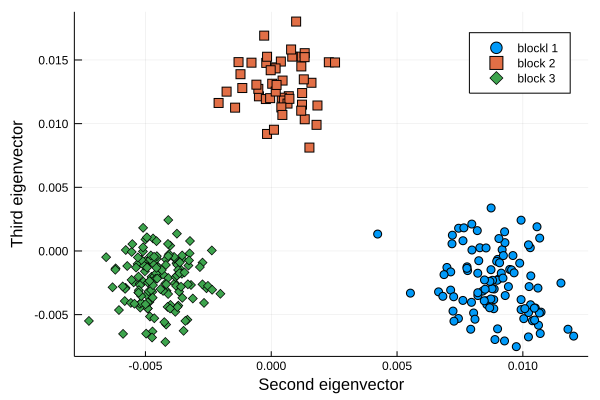

In [4]:
V = first_evecs_Laplacian(A, 3, normalized=true)
n1, n2, n3 = ns
inds1 = 1:n1
inds2 = (n1 + 1):(n1 + n2)
inds3 = (n1 + n2 + 1):(n1 + n2 + n3)
scatter(V[inds1, 2], V[inds1, 3], marker=:circle, 
        xlabel="Second eigenvector", ylabel="Third eigenvector", 
        label="blockl 1", legend=:topright)
scatter!(V[inds2, 2], V[inds2, 3], 
         marker=:square, label="block 2")
scatter!(V[inds3, 2], V[inds3, 3], 
         marker=:diamond, label="block 3")

In [5]:
# Read email-Eu-core
data = readdlm("email-Eu-core.txt")
n = 1005
A = sparse(convert(Vector{Int64}, data[:,1] .+ 1),
           convert(Vector{Int64}, data[:,2] .+ 1), 
           1, n, n)
# Remove diagonal and make undirected
A -= Diagonal(Diagonal(A))
A = min.(max.(A, A'), 1)
# Work with largest connected component
ci = scomponents(A)
inds = shuffle(findall(ci.map .== 1))
A = A[inds, inds]
spy(A, legend=nothing, m=:heat)

In [6]:
# Spectral clustering of the 
k = 10
V = first_evecs_Laplacian(A, k, normalized=true)
assignments = kmeans(V', k).assignments;
inds = [findall(assignments .== i) for i = 1:k]
order = reverse(vcat(inds...))
spy(A[order, order], legend=nothing, m=:heat)